# Project 5. Car Price prediction
### Name: Makarov Vasilii
### Kaggle nickname: Evil_pie27
### Task: to predict the cost of a car according to its characteristics

В файле Project_6_parser написан парсер, который собирает информацию по объявлениям с http://auto.ru/
Однако, в связи с последними политическими событиями цены предложений на рынке хаотичны и могут резко колебаться, а также так как экономические изыскания не входят в курс обучения, то для составления модели были использованы тестовые данные.

In [1]:
import re
import pandas_profiling
from datetime import datetime, date, time
import numpy as np
import pandas as pd
import sys

from tqdm.notebook import tqdm
from pprint import pprint
#from CatBoost import CatBoostRegressor

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, StackingRegressor
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import auc, roc_auc_score, roc_curve, accuracy_score, recall_score, f1_score, mean_absolute_error, mean_squared_error, precision_score

import xgboost as xgb


import warnings
warnings.filterwarnings('ignore')


warnings.filterwarnings('ignore')


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 100)

In [2]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)

Python       : 3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]
Numpy        : 1.20.3


In [3]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [4]:
# Load initial data
train = pd.read_csv("./all_auto_ru_09_09_2020.csv",
                    low_memory=False)  # database for learning model
train = train.rename(columns={'vehicleTransmission': 'gear_box', 'Комплектация': 'grade', 'Привод': 'transmission',
                              'Руль': 'handle', 'Состояние': 'condition', 'Владельцы': 'owners',
                              'ПТС': 'vehicle_licence', 'Таможня': 'custom_office', 'Владение': 'owning_period',
                              'model': 'model_name'})
test = pd.read_csv("./test1.csv", low_memory=False)  # test database
test = test.rename(columns={'vehicleTransmission': 'gear_box', 'Привод': 'transmission',
                            'Руль': 'handle', 'Состояние': 'condition', 'Владельцы': 'owners',
                            'ПТС': 'vehicle_licence', 'Таможня': 'custom_office', 'Владение': 'owning_period'})

sample_submission = pd.read_csv("./sample_submission.csv", low_memory=False)

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89378 entries, 0 to 89377
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              89377 non-null  object 
 1   brand                 89378 non-null  object 
 2   color                 89378 non-null  object 
 3   fuelType              89378 non-null  object 
 4   modelDate             89377 non-null  float64
 5   name                  89377 non-null  object 
 6   numberOfDoors         89377 non-null  float64
 7   productionDate        89378 non-null  int64  
 8   vehicleConfiguration  89377 non-null  object 
 9   gear_box              89377 non-null  object 
 10  engineDisplacement    89377 non-null  object 
 11  enginePower           89377 non-null  float64
 12  description           86124 non-null  object 
 13  mileage               89378 non-null  int64  
 14  grade                 89378 non-null  object 
 15  transmission       

In [6]:
train.sample(3)

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,gear_box,engineDisplacement,enginePower,description,mileage,grade,transmission,handle,condition,owners,vehicle_licence,custom_office,owning_period,price,start_date,hidden,model_name
47078,Внедорожник 5 дв.,NISSAN,0000CC,бензин,2010.0,1.6 CVT (117 л.с.),5.0,2011,ALLROAD_5_DOORS VARIATOR 1.6,VARIATOR,1.6,117.0,Своевременное обслуживание. Камера заднего вида. Окрашен передний бампер (притёрли во дворе). Ко...,100900,"{'id': '7277681', 'name': 'SE+', 'available_options': ['cruise-control', 'sport-seats', 'multi-w...",передний,LEFT,NaN,2.0,ORIGINAL,True,"{'year': 2018, 'month': 4}",620000.0,2020-08-30T17:19:49Z,NaN,JUKE
24080,Седан,HONDA,22A0F8,бензин,2005.0,2.4 AT (190 л.с.),4.0,2007,SEDAN AUTOMATIC 2.4,AUTOMATIC,2.4,190.0,"Машина в богатой комплектации.\nобъем 2.4, 190 л.с. Раздельный климат. Электросидения, люк, ко...",141898,{'id': '0'},передний,LEFT,NaN,1.0,ORIGINAL,True,"{'year': 2007, 'month': 11}",600000.0,2020-08-22T11:11:04Z,NaN,ACCORD
14991,Внедорожник 5 дв.,CHEVROLET,CACECB,бензин,2002.0,1.7 MT (80 л.с.) 4WD,5.0,2004,ALLROAD_5_DOORS MECHANICAL 1.7,MECHANICAL,1.7,80.0,"Продается Chevrolet Niva 2004 года выпуска. Один владелец, аварий не было. Требует ТО тормозной ...",158000,{'id': '0'},полный,LEFT,NaN,1.0,DUPLICATE,True,"{'year': 2004, 'month': 10}",135000.0,2020-07-18T15:10:00Z,NaN,NIVA


In [7]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  object
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15  name                  34686 non-null

In [8]:
test.sample(3)

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,gear_box,vendor,owners,owning_period,vehicle_licence,transmission,handle,condition,custom_office
31790,хэтчбек 5 дв.,MERCEDES,https://auto.ru/cars/used/sale/mercedes/a_klasse/1101333051-353bad05/,белый,NaN,"В машине не курили, ездила девушка дом-работа-дом. Есть незначительные сколы. Машина на ходу, вл...",1.7 LTR,116 N12,NaN,бензин,https://autoru.naydex.net/cSRr96A18/708ec0RhY5eU/ltifIE2VpY8OEtoEUgcl8A4pxbiUSJmmy1wtWL4hITIoUqX...,99399,2008,"{""code"":""A_KLASSE"",""name"":""A-Класс"",""ru_name"":""А-класс"",""morphology"":{},""nameplate"":{""code"":""926...",A_KLASSE,180 1.7 CVT (116 л.с.),5,1603590527,RUB,2012,1101333051,"{""id"":""20494774"",""name"":""180"",""nameplate"":""180"",""displacement"":1699,""engine_type"":""GASOLINE"",""ge...",HATCHBACK_5_DOORS VARIATOR 1.7,вариатор,EUROPEAN,1 владелец,8 лет и 6 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен
27886,внедорожник 5 дв.,MITSUBISHI,https://auto.ru/cars/used/sale/mitsubishi/outlander/1098902372-a5252a99/,чёрный,NaN,Авто на 5 ПЕРЕКУПАМ и АВТОСАЛОНАМ НЕ ПИСАТЬ иНЕ ЗВОНИТЬ!!!!!для реальных покупателей всё расскаж...,2.4 LTR,170 N12,"{""cruise-control"":true,""tinted-glass"":true,""esp"":true,""adaptive-light"":true,""usb"":true,""windclea...",бензин,https://avatars.mds.yandex.net/get-autoru-vos/2074492/86536795343377d7fdb42889e45bb74f/320x240,158000,2005,"{""code"":""OUTLANDER"",""name"":""Outlander"",""ru_name"":""Аутлендер"",""morphology"":{},""nameplate"":{""code""...",OUTLANDER,2.4 CVT (170 л.с.) 4WD,5,1603264385,RUB,2008,1098902372,"{""id"":""2415372"",""displacement"":2360,""engine_type"":""GASOLINE"",""gear_type"":""ALL_WHEEL_DRIVE"",""tran...",ALLROAD_5_DOORS VARIATOR 2.4,вариатор,JAPANESE,3 или более,NaN,Оригинал,полный,Левый,Не требует ремонта,Растаможен
8871,седан,BMW,https://auto.ru/cars/used/sale/bmw/5er/1101267686-eda39338/,чёрный,NaN,"Автомобиль принадлежит юр.лицу.\nНа данный момент находится в лизинге,закрывается перед покупкой...",2.0 LTR,190 N12,"{""wheel-heat"":true,""start-button"":true,""start-stop-function"":true,""decorative-interior-lighting""...",дизель,https://autoru.naydex.net/lICN99c69/9bc7d3Rr7k/cSGPlBpPUy6ABcANL8OCLpOngSp7PuqYyNqYI2-pfaJiTOV-f...,61300,2016,"{""code"":""5ER"",""name"":""5 серии"",""ru_name"":""5 серии"",""morphology"":{},""nameplate"":{""code"":""9265070""...",5ER,520d 2.0d AT (190 л.с.),4,1603112836,RUB,2017,1101267686,"{""id"":""20856383"",""name"":""520"",""nameplate"":""520d"",""displacement"":1995,""engine_type"":""DIESEL"",""gea...",SEDAN AUTOMATIC 2.0,автоматическая,EUROPEAN,2 владельца,NaN,Оригинал,задний,Левый,Не требует ремонта,Растаможен


# Primary Data Inspection

## Gaps and types of data

In [9]:
# for our dates the target feature is are 'price' column. If we get a gaps in it should be remove
print(train.price.isna().sum())

train.dropna(subset=['price'], inplace=True)
print(train.price.isna().sum())

410
0


#### Compare the brands in train data and test data

In [10]:
#compare the brands in train data and test data
brands_train = [brand for brand in train.brand.unique()]   
brands_test = [brand for brand in test.brand.unique()]    
print(brands_train)
print('')
print(brands_test)

#remove all lines with brands that are not in the test
train = train[train.brand.isin(test.brand.unique())]

['AUDI', 'BMW', 'CADILLAC', 'CHERY', 'CHEVROLET', 'CHRYSLER', 'CITROEN', 'DAEWOO', 'DODGE', 'FORD', 'GEELY', 'HONDA', 'HYUNDAI', 'INFINITI', 'JAGUAR', 'JEEP', 'KIA', 'LEXUS', 'MAZDA', 'MINI', 'MITSUBISHI', 'NISSAN', 'OPEL', 'PEUGEOT', 'PORSCHE', 'RENAULT', 'SKODA', 'SUBARU', 'SUZUKI', 'TOYOTA', 'VOLKSWAGEN', 'VOLVO', 'GREAT_WALL', 'LAND_ROVER', 'MERCEDES', 'SSANG_YONG']

['SKODA', 'AUDI', 'HONDA', 'VOLVO', 'BMW', 'NISSAN', 'INFINITI', 'MERCEDES', 'TOYOTA', 'LEXUS', 'VOLKSWAGEN', 'MITSUBISHI']


In [11]:
# Check gaps in other feature
train.isna().sum(), test.isna().sum()

(bodyType                    1
 brand                       0
 color                       0
 fuelType                    0
 modelDate                   1
 name                        1
 numberOfDoors               1
 productionDate              0
 vehicleConfiguration        1
 gear_box                    1
 engineDisplacement          1
 enginePower                 1
 description              1579
 mileage                     0
 grade                       0
 transmission                1
 handle                      0
 condition               49101
 owners                  10953
 vehicle_licence           262
 custom_office               0
 owning_period           34275
 price                       0
 start_date                  0
 hidden                  49101
 model_name                  0
 dtype: int64,
 bodyType                    0
 brand                       0
 car_url                     0
 color                       0
 complectation_dict      28268
 description            

In [12]:
# compare columns in train and test
train_column = []
test_column = []
common_column = []

for col in train.columns:
    if col not in test.columns:
        train_column.append(col)
    else:
        common_column.append(col)

for col in test.columns:
    if col not in train.columns:
        test_column.append(col)
    else:
        if col not in common_column:
            common_column.append(col)
        else:
            continue
            
print('Have in train, but not in test')
print(train_column)
print('Have in test, but not in train')
print(test_column)
print('Common columns')
print(common_column)

Have in train, but not in test
['grade', 'price', 'start_date', 'hidden']
Have in test, but not in train
['car_url', 'complectation_dict', 'equipment_dict', 'image', 'model_info', 'parsing_unixtime', 'priceCurrency', 'sell_id', 'super_gen', 'vendor']
Common columns
['bodyType', 'brand', 'color', 'fuelType', 'modelDate', 'name', 'numberOfDoors', 'productionDate', 'vehicleConfiguration', 'gear_box', 'engineDisplacement', 'enginePower', 'description', 'mileage', 'transmission', 'handle', 'condition', 'owners', 'vehicle_licence', 'custom_office', 'owning_period', 'model_name']


# Data Preprocessing
#### bodyType

In [13]:
test.bodyType.value_counts(), train.bodyType.value_counts()

(седан                      13147
 внедорожник 5 дв.          12228
 лифтбек                     2232
 хэтчбек 5 дв.               2124
 универсал 5 дв.             1276
 минивэн                      995
 купе                         824
 компактвэн                   489
 хэтчбек 3 дв.                485
 пикап двойная кабина         280
 купе-хардтоп                 158
 внедорожник 3 дв.            115
 родстер                       99
 фургон                        97
 кабриолет                     90
 седан-хардтоп                 12
 микровэн                       7
 седан 2 дв.                    6
 лимузин                        6
 пикап одинарная кабина         5
 пикап полуторная кабина        5
 внедорожник открытый           3
 тарга                          2
 фастбек                        1
 Name: bodyType, dtype: int64,
 Внедорожник 5 дв.                   19984
 Седан                               16662
 Лифтбек                              2566
 Хэтчбек 5 дв.          

Here is a lot of numbers of data categories, that have repeat and only difference is are numbers of doors.
For many models of vehicle have only one possibly body type on the line model. So we can enlarge the categories 

In [14]:
# Train

# Split line and keep first word only
train['bodyType'] = train.bodyType.apply(
    lambda x: x.lower().split()[0].strip() if isinstance(x, str) else x)
train['bodyType'] = train.bodyType.apply(
    lambda x: x.lower().split('-')[0].strip() if isinstance(x, str) else x)


def body_type_uniformity(bodyType):
    '''
    This function enlarges the car body categories - rodster and cabriolet collect on category "open";
    minivan, compackvan or microvan - 'van';
    liftback and fastback - 'liftback'
    '''

    if bodyType == 'родстер' or bodyType == 'кабриолет' or bodyType == 'тарга':
        return 'открытый'
    elif bodyType == 'минивэн' or bodyType == 'компактвэн' or bodyType == 'микровэн':
        return 'вэн'
    elif bodyType == 'лифтбек' or bodyType == 'фастбек':
        return 'лифтбек'
    else:
        return bodyType


train['bodyType'] = train.bodyType.apply(lambda x: body_type_uniformity(x))

# Test

# Split line and keep first word only
test['bodyType'] = test.bodyType.apply(lambda x: x.lower().split()[
                                       0].strip() if isinstance(x, str) else x)
test['bodyType'] = test.bodyType.apply(
    lambda x: x.lower().split('-')[0].strip() if isinstance(x, str) else x)

test['bodyType'] = test.bodyType.apply(lambda x: body_type_uniformity(x))

train.bodyType.value_counts(), test.bodyType.value_counts()

(внедорожник    20152
 седан          17974
 лифтбек         2869
 хэтчбек         2823
 вэн             1931
 универсал       1432
 купе            1156
 пикап            383
 открытый         240
 фургон           134
 лимузин            6
 Name: bodyType, dtype: int64,
 седан          13165
 внедорожник    12346
 хэтчбек         2609
 лифтбек         2233
 вэн             1491
 универсал       1276
 купе             982
 пикап            290
 открытый         191
 фургон            97
 лимузин            6
 Name: bodyType, dtype: int64)

#### color

In [15]:
test.color.value_counts(), train.color.value_counts()

(чёрный         11010
 белый           6133
 серебристый     4113
 серый           3984
 синий           3289
 красный         1531
 коричневый      1501
 зелёный          952
 бежевый          639
 голубой          457
 золотистый       266
 пурпурный        254
 фиолетовый       219
 жёлтый           194
 оранжевый        131
 розовый           13
 Name: color, dtype: int64,
 040001    16135
 FAFBFB     8988
 97948F     5622
 CACECB     5497
 0000CC     4963
 200204     2028
 EE1D19     1784
 007F00     1321
 C49648      857
 22A0F8      591
 DEA522      317
 660099      314
 4A2197      248
 FFD600      224
 FF8649      199
 FFC0CB       13
 Name: color, dtype: int64)

In the train database contains the color code. convert code to title

In [16]:
colors = {
    '040001': 'чёрный',
    '0000CC': 'синий',
    'FAFBFB': 'белый',
    '97948F': 'серый',
    'CACECB': 'серый',
    '200204': 'чёрный',
    'EE1D19': 'красный',
    'FFC0CB': 'розовый',
    'C49648': 'золотистый',
    '22A0F8': 'голубой',
    'FF8649': 'оранжевый',
    '007F00': 'зелёный',
    'DEA522': 'золотистый',
    '660099': 'фиолетовый',
    '4A2197': 'фиолетовый',
    'FFD600': 'жёлтый'
}

train.color = train.color.map(colors)

#### fuelType

In [17]:
test.fuelType.value_counts(), train.fuelType.value_counts()
# both the same, nothing to change

(бензин     28601
 дизель      5800
 гибрид       223
 электро       55
 газ            7
 Name: fuelType, dtype: int64,
 бензин       39262
 дизель        9464
 гибрид         268
 электро         96
 газ             10
 универсал        1
 Name: fuelType, dtype: int64)

#### modelDate

In [18]:
# I found 1 gap in model Date column remove it
train.dropna(subset=['modelDate'], inplace=True)

# transform  data type on int64
train['modelDate'] = train['modelDate'].astype('int64')

#### name

In [19]:
train.name.value_counts(), test.name.value_counts()

(1.6 AT (110 л.с.)                                    1178
 2.0 CVT (146 л.с.) 4WD                                628
 1.4 AMT (150 л.с.)                                    626
 1.6 MT (110 л.с.)                                     595
 2.0 CVT (144 л.с.) 4WD                                572
 1.6 MT (102 л.с.)                                     454
 2.0 AT (249 л.с.) 4WD                                 401
 2.0 CVT (144 л.с.)                                    401
 2.0 CVT (146 л.с.)                                    391
 1.6 MT (105 л.с.)                                     387
 2.0 AMT (249 л.с.) 4WD                                374
 2.5 AT (181 л.с.)                                     333
 450 3.0 AT (367 л.с.) 4WD                             323
 1.8 AMT (152 л.с.)                                    317
 1.4 AMT (122 л.с.)                                    314
 400 d 2.9d AT (330 л.с.) 4WD                          312
 1.6 AT (105 л.с.)                                     3

The name attribute contains information about the engine size, power, gearbox type, and drive type. This information is in other signs. The attribute will not be used for further processing

#### numberOfDoors

In [20]:
train.numberOfDoors.value_counts(), test.numberOfDoors.value_counts()

(5.0    27631
 4.0    19295
 2.0     1434
 3.0      739
 0.0        1
 Name: numberOfDoors, dtype: int64,
 5    18703
 4    14126
 2     1206
 3      650
 0        1
 Name: numberOfDoors, dtype: int64)

I found 1 gap in model Date column remove it, lets check in

In [21]:
train.loc[train.numberOfDoors == 0]

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,gear_box,engineDisplacement,enginePower,description,mileage,grade,transmission,handle,condition,owners,vehicle_licence,custom_office,owning_period,price,start_date,hidden,model_name
88065,открытый,MERCEDES,белый,бензин,1904,5.3 MT (32 л.с.),0.0,1904,CABRIO MECHANICAL 5.3,MECHANICAL,5.3,32.0,"на ходу. 1904 год. стоит в гараже, пылится.Катаюсь редко.В 2018 прошла мелкий косметический ремо...",48000,{'id': '0'},задний,RIGHT,NaN,1.0,ORIGINAL,True,"{'year': 2014, 'month': 2}",12000000.0,2019-11-20T14:14:11Z,NaN,SIMPLEX


In [22]:
test.loc[test.numberOfDoors == 0]

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,gear_box,vendor,owners,owning_period,vehicle_licence,transmission,handle,condition,custom_office
16944,открытый,MERCEDES,https://auto.ru/cars/used/sale/mercedes/simplex/1093802104-d76601f9/,белый,NaN,"на ходу. 1904 год. стоит в гараже, пылится.Катаюсь редко.В 2018 прошла мелкий косметический ремо...",5.3 LTR,32 N12,NaN,бензин,https://autoru.naydex.net/ESooa9149/468b9eoMemRk/qYMsjh4E8B__rflVJVfy7b1b-wUX9sx_4S5vynlzIYdgyUP...,48000,1904,"{""code"":""SIMPLEX"",""name"":""Simplex"",""ru_name"":""Симплекс"",""morphology"":{},""nameplate"":{""code"":"""",""...",SIMPLEX,5.3 MT (32 л.с.),0,1603245843,RUB,1904,1093802104,"{""id"":""21743990"",""displacement"":5322,""engine_type"":""GASOLINE"",""gear_type"":""REAR_DRIVE"",""transmis...",CABRIO MECHANICAL 5.3,механическая,EUROPEAN,1 владелец,6 лет и 8 месяцев,Оригинал,задний,Правый,Не требует ремонта,Растаможен


In both data bases this is the same car. By design, this car has 4 doors

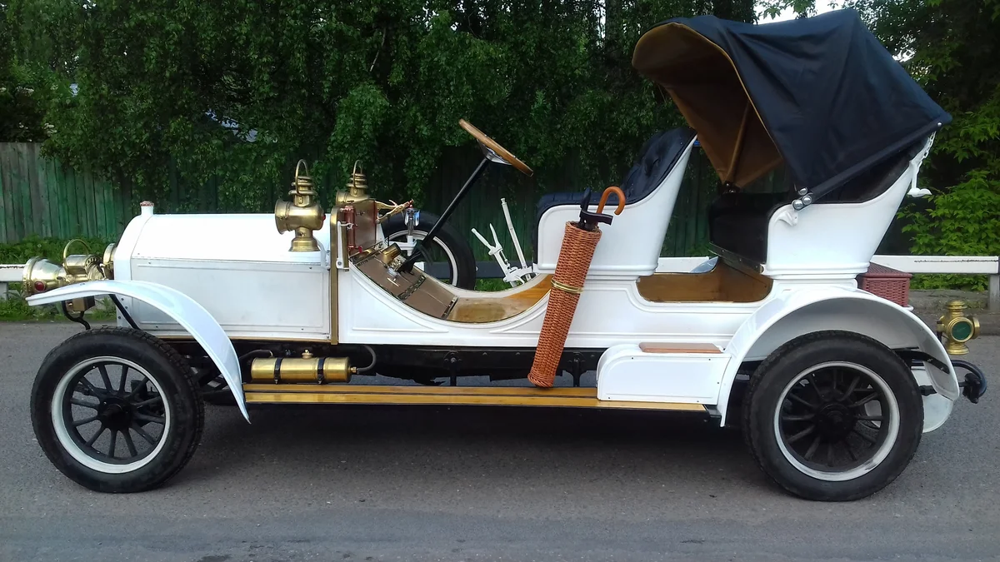

In [23]:
train.numberOfDoors.fillna(4, inplace=True)
test.numberOfDoors.fillna(4, inplace=True)

#### productionDate

In [24]:
train.productionDate.value_counts(), test.productionDate.value_counts()

# both the same, nothing to change

(2020    10110
 2008     3112
 2012     2993
 2011     2922
 2013     2557
 2007     2308
 2014     2195
 2010     2089
 2019     1910
 2015     1739
 2016     1617
 2017     1560
 2006     1477
 2018     1465
 2005     1199
 2009     1171
 2004     1074
 2003     1017
 2002      879
 2001      845
 1998      698
 1999      677
 2000      647
 1997      528
 1996      306
 1992      271
 1994      259
 1995      251
 1991      247
 1993      246
 1990      166
 1989      127
 1988      120
 1987       67
 1986       49
 1985       42
 1984       29
 1983       28
 1982       14
 1980       12
 1981        9
 1978        6
 1973        6
 1979        5
 1959        4
 1976        4
 1972        3
 1937        3
 1977        3
 1938        3
 1967        2
 1970        2
 1964        2
 1974        2
 1969        2
 1950        2
 1953        2
 1952        2
 1975        2
 1961        1
 1960        1
 1957        1
 1968        1
 1954        1
 1904        1
 1948        1
 1966     

#### vehicleConfiguration

In [25]:
train.vehicleConfiguration.value_counts(), test.vehicleConfiguration.value_counts()

(ALLROAD_5_DOORS VARIATOR 2.0              2909
 SEDAN MECHANICAL 1.6                      1623
 SEDAN AUTOMATIC 1.6                       1167
 ALLROAD_5_DOORS AUTOMATIC 2.0              996
 ALLROAD_5_DOORS AUTOMATIC 350              934
 SEDAN AUTOMATIC 200                        809
 ALLROAD_5_DOORS AUTOMATIC 3.0d             753
 SEDAN AUTOMATIC 2.4                        712
 LIFTBACK AUTOMATIC 1.6                     690
 SEDAN AUTOMATIC 2.0                        664
 SEDAN AUTOMATIC 2.5                        637
 SEDAN MECHANICAL 1.8                       621
 ALLROAD_5_DOORS ROBOT 2.0                  588
 LIFTBACK MECHANICAL 1.6                    587
 ALLROAD_5_DOORS ROBOT 1.4                  552
 ALLROAD_5_DOORS AUTOMATIC 300              503
 ALLROAD_5_DOORS AUTOMATIC 20d              494
 ALLROAD_5_DOORS AUTOMATIC 30d              493
 SEDAN AUTOMATIC 350                        486
 ALLROAD_5_DOORS AUTOMATIC 2.5              483
 SEDAN AUTOMATIC 1.8                    

The vehicleConfiguration attribute contains information about the engine size and body type. This information is in other signs. The attribute will not be used for further processing

#### gear_box

In [26]:
train.gear_box.value_counts(), test.gear_box.value_counts()

(AUTOMATIC     28306
 MECHANICAL     8797
 VARIATOR       6245
 ROBOT          5752
 Name: gear_box, dtype: int64,
 автоматическая      19596
 механическая         7209
 вариатор             3999
 роботизированная     3882
 Name: gear_box, dtype: int64)

Two different ways to wright same information - on English and on Russian. Make comparing

In [27]:
gear = {
    'автоматическая': 'AUTOMATIC',
    'механическая': 'MECHANICAL',
    'вариатор': 'VARIATOR',
    'роботизированная': 'ROBOT'
}

test.gear_box = test.gear_box.map(gear)

#### engineDisplacement

In [28]:
train.engineDisplacement.value_counts(), test.engineDisplacement.value_counts()

(2.0             7031
 1.6             5726
 1.8             3037
 1.4             2337
 2.5             1806
 2.4             1561
 200             1514
 350             1494
 2.0d             996
 3.5              967
 3.0d             914
 300              688
 3.0              686
 2.5d             619
 250              591
 500              574
 1.5              571
 320i             550
 450              501
 20d              496
 30d              494
 180              482
 1.2              477
 400              475
 2.4d             468
 520d             344
 20i              327
 63               326
 520i             322
 4.5d             318
 320              309
 220              302
 320d             287
 1.3              278
 35i              256
 2.8              233
 530d             228
 1.9d             226
 4.0              220
 3.6              217
 Long             187
 3.2              184
 5.6              184
 318i             177
 4.4              172
 230      

In [29]:
train.engineDisplacement.isna().sum(), test.engineDisplacement.isna().sum()

(0, 0)

In [30]:
# Test

# This is two different visions of data. Lets start from 'test' database and keep a volume of engine only
# remove unnecessary information in the cell with the volume of the engine
test['engineDisplacement'] = test.engineDisplacement.apply(lambda x: x.split()[0].strip() if isinstance(x, str) else x)

test.engineDisplacement.value_counts()

2.0    7391
1.6    4973
3.0    3915
1.8    3349
2.5    2477
2.4    1745
3.5    1710
1.4    1635
1.5     725
1.2     485
4.4     447
2.8     384
4.7     377
1.3     365
5.5     361
4.0     356
3.2     348
4.5     346
2.1     271
3.7     242
2.2     236
4.2     228
1.9     221
2.3     203
2.7     189
3.6     183
5.6     170
5.0     158
5.7     135
2.9     131
4.6     108
3.1      88
4.8      84
1.7      59
1.0      57
3.8      57
2.6      55
LTR      55
6.0      53
0.7      53
3.3      44
3.4      36
4.1      35
4.3      32
5.4      31
6.2      28
5.2      12
5.9      12
6.3       8
5.8       7
6.6       6
4.9       4
1.1       4
3.9       1
5.3       1
Name: engineDisplacement, dtype: int64

In [31]:
test.loc[test.engineDisplacement == 'LTR']

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,gear_box,vendor,owners,owning_period,vehicle_licence,transmission,handle,condition,custom_office
5241,внедорожник,AUDI,https://auto.ru/cars/used/sale/audi/e_tron/1101083243-faf3b308/,белый,NaN,"Audi e-tron Prestige quattro от Moscow Tesla Club.\n\nАвтомобиль произведен в июне 2019, состоян...",LTR,408 N12,"{""asr"":true,""esp"":true,""usb"":true,""e-adjustment-wheel"":true,""multi-wheel"":true,""audiosystem-tv"":...",электро,https://avatars.mds.yandex.net/get-autoru-vos/1964188/79c67d33a2eaa59466310bccc4c5a745/320x240,885,2018,"{""code"":""E_TRON"",""name"":""e-tron"",""ru_name"":""И-трон"",""morphology"":{},""nameplate"":{""code"":""1264993...",E_TRON,55 Electro AT (301 кВт) 4WD,5,1603132719,RUB,2019,1101083243,"{""id"":""22291114"",""name"":""55"",""nameplate"":""55"",""displacement"":0,""engine_type"":""ELECTRO"",""gear_typ...",ALLROAD_5_DOORS AUTOMATIC,AUTOMATIC,EUROPEAN,1 владелец,1 год и 3 месяца,Оригинал,полный,Левый,Не требует ремонта,Растаможен
7992,хэтчбек,BMW,https://auto.ru/cars/used/sale/bmw/i3/1101043134-0ed664c0/,синий,NaN,"Атомобиль из Германии,без пробега по РФ.\nНа гарантии.до мая 2021 года.\nОчень хорошая комплекта...",LTR,170 N12,NaN,электро,https://avatars.mds.yandex.net/get-autoru-vos/1907070/356de012cd64ee7cc3d0294425ef8482/320x240,32000,2017,"{""code"":""I3"",""name"":""i3"",""ru_name"":""и3"",""morphology"":{},""nameplate"":{""code"":"""",""name"":"""",""semant...",I3,Electro AT (126 кВт),5,1603109407,RUB,2018,1101043134,"{""id"":""21624534"",""displacement"":0,""engine_type"":""ELECTRO"",""gear_type"":""REAR_DRIVE"",""transmission...",HATCHBACK_5_DOORS AUTOMATIC,AUTOMATIC,EUROPEAN,1 владелец,NaN,Оригинал,задний,Левый,Не требует ремонта,Растаможен
8252,хэтчбек,BMW,https://auto.ru/cars/used/sale/bmw/i3/1101278018-b5bcfe15/,серый,NaN,"Пробег 54000 км, запас хода на зарядке 130 км+неограничено при включении экстендера. (extender э...",LTR,170 N12,"{""park-assist-f"":true,""park-assist-r"":true}",электро,https://autoru.naydex.net/lICN99c69/9bc7d3Rr7k/cSGPlBpPUy6ABcANL8OCLpOngSp7PuqYyNqYI2-pfaJiTOV-f...,51000,2013,"{""code"":""I3"",""name"":""i3"",""ru_name"":""и3"",""morphology"":{},""nameplate"":{""code"":"""",""name"":"""",""semant...",I3,Electro AT (126 кВт),5,1603110423,RUB,2014,1101278018,"{""id"":""20465813"",""displacement"":0,""engine_type"":""ELECTRO"",""gear_type"":""REAR_DRIVE"",""transmission...",HATCHBACK_5_DOORS AUTOMATIC,AUTOMATIC,EUROPEAN,1 владелец,1 месяц,Оригинал,задний,Левый,Не требует ремонта,Растаможен
8350,хэтчбек,BMW,https://auto.ru/cars/used/sale/bmw/i3/1100271628-f0b14b0a/,белый,"{""id"":""21624597"",""name"":""i3 120 Ah"",""available_options"":[""cruise-control"",""multi-wheel"",""airbag-...","Автомобиль в наличии Москве , с ПТС , производства 2018 года .\nСостояние нового автомобиля .\nА...",LTR,170 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""usb"":true,""multi-wheel"":true,""ashtray-and-cigarett...",электро,https://avatars.mds.yandex.net/get-autoru-vos/2045363/f4b777901bc47b0ab96868e91b34f22f/320x240,25000,2017,"{""code"":""I3"",""name"":""i3"",""ru_name"":""и3"",""morphology"":{},""nameplate"":{""code"":"""",""name"":"""",""semant...",I3,Electro AT (126 кВт),5,1603110814,RUB,2018,1100271628,"{""id"":""21624534"",""displacement"":0,""engine_type"":""ELECTRO"",""gear_type"":""REAR_DRIVE"",""transmission...",HATCHBACK_5_DOORS AUTOMATIC,AUTOMATIC,EUROPEAN,1 владелец,NaN,Оригинал,задний,Левый,Не требует ремонта,Растаможен
8684,хэтчбек,BMW,https://auto.ru/cars/used/sale/bmw/i3/1101174554-96a8ddf3/,чёрный,NaN,BMW I 3 REX\nфевраль 2017 года выпуска.\nПриобретен на аукционе Manheim. Автомобиль без ДТП . Пр...,LTR,170 N12,"{""cruise-control"":true,""glonass"":true,""navigation"":true,""roof-rails"":true,""rear-c

In [32]:
# In data we have lines without volume of engine, and 'LTR' only.
# This is an electro-car. Make one more column with information about electro engine

def electro_engine_yes(engineDisplacement):
    '''
    This function checks the data in the column and returns information about the electric car
    '''

    if engineDisplacement == 'LTR' or engineDisplacement == 'nan':
        return 1
    else:
        return 0


test['electro_engine_yes'] = test.engineDisplacement.apply(
    lambda x: electro_engine_yes(x))
test['engineDisplacement'] = test.engineDisplacement.apply(
    lambda x: 0 if x == 'LTR' else x)

test.sample(3)

,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,image,mileage,modelDate,model_info,model_name,name,numberOfDoors,parsing_unixtime,priceCurrency,productionDate,sell_id,super_gen,vehicleConfiguration,gear_box,vendor,owners,owning_period,vehicle_licence,transmission,handle,condition,custom_office,electro_engine_yes
19434,купе,TOYOTA,https://auto.ru/cars/used/sale/toyota/sera/1099849734-8d7d4d68/,синий,NaN,Друзья спасибо что пишите и интересуетесь моделью. Цена на данный момент изменилась так как прод...,1.5,110 N12,NaN,бензин,https://avatars.mds.yandex.net/get-autoru-vos/2003162/f46c49baeeda081b3c6b37459b5939a4/320x240,120000,1990,"{""code"":""SERA"",""name"":""Sera"",""ru_name"":""Сера"",""morphology"":{""gender"":""FEMININE""},""nameplate"":{""c...",SERA,1.5 MT (110 л.с.),2,1603287899,RUB,1990,1099849734,"{""id"":""8304760"",""displacement"":1496,""engine_type"":""GASOLINE"",""gear_type"":""FORWARD_CONTROL"",""tran...",COUPE MECHANICAL 1.5,MECHANICAL,JAPANESE,3 или более,NaN,Оригинал,передний,Правый,Не требует ремонта,Растаможен,0
24405,универсал,VOLKSWAGEN,https://auto.ru/cars/used/sale/volkswagen/passat/1100879200-c235ce89/,синий,NaN,Год выпуска: 1999. Пробег: 236 000 км. Кузов: универсал 5 дв.. Цвет: синий. Двигатель: 1.8 л / 1...,1.8,125 N12,NaN,бензин,https://avatars.mds.yandex.net/get-autoru-vos/1687199/56149b4a36dcae26ccbf87701a66e39a/320x240,236000,1996,"{""code"":""PASSAT"",""name"":""Passat"",""ru_name"":""Пассат"",""morphology"":{},""nameplate"":{""code"":"""",""name...",PASSAT,1.8 AT (125 л.с.),5,1603217468,RUB,1999,1100879200,"{""id"":""21287623"",""displacement"":1781,""engine_type"":""GASOLINE"",""gear_type"":""FORWARD_CONTROL"",""tra...",WAGON_5_DOORS AUTOMATIC 1.8,AUTOMATIC,EUROPEAN,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен,0
23780,внедорожник,VOLKSWAGEN,https://auto.ru/cars/used/sale/volkswagen/tiguan/1101160339-8b01125f/,чёрный,"{""id"":""3784749"",""name"":""Sport&Style"",""available_options"":[""airbag-passenger"",""lock"",""electro-mir...",Пишите смс прилечу в Москву 18 числа \nВ данный момент нахожусь в командировке \nИдеальное техни...,1.4,150 N12,"{""electro-window-back"":true,""esp"":true,""ptf"":true,""airbag-driver"":true,""airbag-side"":true,""mirro...",бензин,https://avatars.mds.yandex.net/get-autoru-vos/2188061/5d06efb8cb603d0df860d404edbfc0ea/320x240,175000,2007,"{""code"":""TIGUAN"",""name"":""Tiguan"",""ru_name"":""Тигуан"",""morphology"":{},""nameplate"":{""code"":"""",""name...",TIGUAN,1.4 MT (150 л.с.) 4WD,5,1603215074,RUB,2008,1101160339,"{""id"":""3784484"",""displacement"":1390,""engine_type"":""GASOLINE"",""gear_type"":""ALL_WHEEL_DRIVE"",""tran...",ALLROAD_5_DOORS MECHANICAL 1.4,MECHANICAL,EUROPEAN,3 или более,NaN,Оригинал,полный,Левый,Не требует ремонта,Растаможен,0


In [33]:
# Train

#  in 'train' database have the dirty datas. Get the volume from 'name' column
train['eng_vol'] = train['name'].str.findall(r'\d\.\d').str[0]
train['eng_vol'] = train['eng_vol'].astype('float')

train.eng_vol.fillna('nan', inplace=True)

In [34]:
train.loc[train.eng_vol == 'nan']
# Again, Nan datas is are electro-car. Make one more column with information about electro engine

,bodyType,brand,color,fuelType,modelDate,name,numberOfDoors,productionDate,vehicleConfiguration,gear_box,engineDisplacement,enginePower,description,mileage,grade,transmission,handle,condition,owners,vehicle_licence,custom_office,owning_period,price,start_date,hidden,model_name,eng_vol
2851,внедорожник,AUDI,синий,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291462', 'name': 'Design 55 quattro', 'available_options': ['cruise-control', 'e-adjus...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7517500.0,2020-09-02T16:29:19Z,NaN,E_TRON,nan
2852,внедорожник,AUDI,чёрный,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291467', 'name': 'Sport 55 quattro', 'available_options': ['cruise-control', 'sport-se...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7607970.0,2020-09-02T16:29:19Z,NaN,E_TRON,nan
2853,внедорожник,AUDI,красный,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291467', 'name': 'Sport 55 quattro', 'available_options': ['cruise-control', 'sport-se...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7920300.0,2020-07-03T17:00:02Z,NaN,E_TRON,nan
2854,внедорожник,AUDI,синий,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291462', 'name': 'Design 55 quattro', 'available_options': ['cruise-control', 'e-adjus...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,8078200.0,2020-07-03T17:00:02Z,NaN,E_TRON,nan
2855,внедорожник,AUDI,чёрный,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291462', 'name': 'Design 55 quattro', 'available_options': ['cruise-control', 'e-adjus...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,8037300.0,2020-08-04T16:44:42Z,NaN,E_TRON,nan
2856,внедорожник,AUDI,синий,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291462', 'name': 'Design 55 quattro', 'available_options': ['cruise-control', 'e-adjus...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7761000.0,2020-07-03T17:00:02Z,NaN,E_TRON,nan
2857,внедорожник,AUDI,чёрный,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291462', 'name': 'Design 55 quattro', 'available_options': ['cruise-control', 'e-adjus...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7813100.0,2020-07-08T15:45:26Z,NaN,E_TRON,nan
2858,внедорожник,AUDI,чёрный,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291467', 'name': 'Sport 55 quattro', 'available_options': ['cruise-control', 'sport-se...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7675000.0,2020-07-03T17:00:02Z,NaN,E_TRON,nan
2859,внедорожник,AUDI,белый,электро,2018,55 Electro AT (301 кВт) 4WD,5.0,2020,ALLROAD_5_DOORS AUTOMATIC 55,AUTOMATIC,55,408.0,Новый дилерский центр Ауди в Москве.\n\nУникальные условия в честь открытия самого большого Диле...,0,"{'id': '22291467', 'name': 'Sport 55 quattro', 'available_options': ['cruise-control', 'sport-se...",полный,LEFT,NaN,NaN,ORIGINAL,True,NaN,7681400.0,2020-07-03T17:00:0

In [35]:
# Fill in Train engineDisplacement column
train['engineDisplacement'] = train['eng_vol']
train['electro_engine_yes'] = train.engineDisplacement.apply(
    lambda x: electro_engine_yes(x))
train['engineDisplacement'] = train.engineDisplacement.apply(
    lambda x: 0 if x == 'nan' else x)
train.drop('eng_vol', axis=1, inplace=True)

#### enginePower

In [36]:
# Test

# remove unnecessary information in the cell with the volume of the engine
test['enginePower'] = test.enginePower.apply(
    lambda x: int(x.split()[0].strip()) if isinstance(x, str) else x)

# Train

train['enginePower'] = train.enginePower.apply(lambda x: int(x))

test.enginePower.value_counts(), train.enginePower.value_counts()

(249    1708
 150    1699
 110    1039
 170     977
 105     955
 140     942
 184     923
 152     873
 102     832
 190     779
 180     733
 122     607
 98      569
 90      533
 245     511
 141     507
 136     479
 272     466
 306     451
 144     439
 211     432
 160     432
 117     420
 235     386
 333     383
 200     378
 146     367
 125     359
 181     356
 204     356
 115     339
 75      331
 163     322
 231     308
 177     301
 156     300
 167     297
 218     286
 109     283
 280     280
 210     279
 124     249
 143     221
 367     220
 174     214
 107     203
 116     200
 224     195
 258     194
 165     188
 147     188
 238     184
 173     182
 220     180
 182     178
 388     177
 178     167
 130     153
 192     147
 340     147
 225     145
 101     136
 135     130
 320     128
 405     127
 277     125
 407     124
 99      118
 129     117
 250     115
 169     112
 193     111
 88      111
 85      108
 114     105
 185     103
 158     102

#### description

In [37]:
# Sample
train['description'][10]

'Продаю срочно, мотор коробка работает как часы, левый задний крыло + крышка багажника крашенный, причина не знаю так купил, остальные всё ок. Пороги, дно, под домкратники, чашки амортизаторы все целый. Остальные вопросы по телефону'

In [38]:
test['description'][10]

'ЛОТ: 01209934\nFAVORIT MOTORS KIA Юг\nДанный автомобиль прошел диагностику по 147 пунктам и имеет сертификат технической гарантии.\n\n\nВы можете получить скидку на данный автомобиль до 50000 рублей. Подробности уточняйте у менеджеров отдела продаж.\n\nГК FAVORIT MOTORS строит свою работу на принципах открытости и честности! Нам доверяют более 25 лет.\n\n- Автомобиль продается официальным дилером FAVORIT MOTORS.\n- Покупка и обслуживание у официального дилера.\n- Проведена предпродажная подготовка,\n- Гарантия юридической чистоты.\n- Круглосуточная техническая поддержка с бесплатным эвакуатором.\n\n- Автомобиль можно приобрести за наличный расчет, безналичным платежом, а также мы примем вашу машину по рыночной стоимости в рамках программы трейд-ин и при необходимости — выплатим за нее кредит.\n\n- Возможна покупка в кредит: специальные предложения по кредитованию и страхованию.\n- Оформление кредита по двум документам.\n- КАСКО не обязательно.\n\nПриглашаем на бесплатный тест-драйв!\n

In [39]:
# calculate the length of the comment and based on length create a numerical feature
train['description_len'] = train.description.apply(lambda x: len(str(x)))
test['description_len'] = test.description.apply(lambda x: len(str(x)))

#### handle

In [40]:
train.handle.value_counts(), test.handle.value_counts()

(LEFT     47567
 RIGHT     1533
 Name: handle, dtype: int64,
 Левый     33287
 Правый     1399
 Name: handle, dtype: int64)

In [41]:
handle = {
    'Левый': 'LEFT',
    'Правый': 'RIGHT'
}

test.handle = test.handle.map(handle)

train.handle.value_counts(), test.handle.value_counts()

(LEFT     47567
 RIGHT     1533
 Name: handle, dtype: int64,
 LEFT     33287
 RIGHT     1399
 Name: handle, dtype: int64)

#### condition

In [42]:
train.condition.isna().sum(), test.condition.isna().sum()

(49100, 0)

In [43]:
train.condition.value_counts(), test.condition.value_counts()

(Series([], Name: condition, dtype: int64),
 Не требует ремонта    34686
 Name: condition, dtype: int64)

In condition column on train database haven't datas at all, on test database have only one value for all position. We will not use this feature

#### owners

In [44]:
train.owners.value_counts(normalize=True), test.owners.value_counts()

(3.0    0.498860
 2.0    0.267675
 1.0    0.233465
 Name: owners, dtype: float64,
 3 или более    15957
 1 владелец      9459
 2 владельца     9270
 Name: owners, dtype: int64)

In [45]:
train.owners.isna().sum(), test.owners.isna().sum()

(10953, 0)

Fill in the gaps in the train with a random distribution, in accordance with the available data.
After that convert all position into integer.

In the test no gaps. Convert datas to integer

In [46]:
train.owners.fillna('GAP', inplace=True)
train['owners'] = train['owners'].apply(lambda x: int(x) if x != 'GAP' else x)
train['owners'] = train['owners'].apply(lambda x: np.random.choice([3, 2, 1],
                                                                   p=[0.498860, 0.267675, 0.233465])
                                        if x == 'GAP' else x)


test['owners'] = test['owners'].apply(
    lambda x: int(x[0]) if type(x) == str else x)

#### vehicle_licence

In [47]:
# fill in the gaps with "original" as the most common
train.vehicle_licence.fillna('ORIGINAL', inplace=True)
test.vehicle_licence.fillna('Оригинал', inplace=True)

train.vehicle_licence.value_counts(), test.vehicle_licence.value_counts()

(ORIGINAL     43476
 DUPLICATE     5624
 Name: vehicle_licence, dtype: int64,
 Оригинал    30099
 Дубликат     4587
 Name: vehicle_licence, dtype: int64)

In [48]:
vehicle_licence = {
    'Оригинал': 'ORIGINAL',
    'Дубликат': 'DUPLICATE'
}

test.vehicle_licence = test.vehicle_licence.map(vehicle_licence)

train.vehicle_licence.value_counts(), test.vehicle_licence.value_counts()

(ORIGINAL     43476
 DUPLICATE     5624
 Name: vehicle_licence, dtype: int64,
 ORIGINAL     30099
 DUPLICATE     4587
 Name: vehicle_licence, dtype: int64)

#### custom_office

In [49]:
train.custom_office.value_counts(), test.custom_office.value_counts()

(True    49100
 Name: custom_office, dtype: int64,
 Растаможен    34686
 Name: custom_office, dtype: int64)

In [50]:
train['custom_office'].isna().sum(), test['custom_office'].isna().sum()

(0, 0)

feature has only 1 value. In the future, we will not use

#### owning_period

In [51]:
# Train

train['owning_period'].isna().value_counts(normalize = True)

True     0.698045
False    0.301955
Name: owning_period, dtype: float64

In [52]:
train['owning_period'].value_counts()

{'year': 2018, 'month': 10}    260
{'year': 2018, 'month': 8}     253
{'year': 2019, 'month': 8}     253
{'year': 2018, 'month': 11}    245
{'year': 2019, 'month': 10}    245
{'year': 2018, 'month': 9}     238
{'year': 2018, 'month': 6}     236
{'year': 2018, 'month': 12}    224
{'year': 2018, 'month': 5}     224
{'year': 2019, 'month': 3}     224
{'year': 2019, 'month': 4}     219
{'year': 2019, 'month': 9}     216
{'year': 2018, 'month': 4}     214
{'year': 2019, 'month': 6}     209
{'year': 2019, 'month': 7}     209
{'year': 2019, 'month': 5}     208
{'year': 2020, 'month': 1}     206
{'year': 2019, 'month': 11}    201
{'year': 2019, 'month': 12}    200
{'year': 2018, 'month': 7}     197
{'year': 2017, 'month': 10}    196
{'year': 2017, 'month': 12}    193
{'year': 2019, 'month': 2}     191
{'year': 2019, 'month': 1}     189
{'year': 2018, 'month': 1}     185
{'year': 2017, 'month': 8}     180
{'year': 2017, 'month': 9}     176
{'year': 2018, 'month': 3}     174
{'year': 2017, 'mont

In the column owning_period have too many gaps. We decided to make other column 'ownership' - a number of days of owning of car. 

In [53]:
# at first, all gaps will be replaced by 'GAP'

train.owning_period.fillna('GAP', inplace=True)


def train_ownership_refill(owning_period, start_date, productionDate, owners):
    '''
    this function converts the date representation in the database to the number of days since 1970.
    For a row that has the owning_period, the ownership period is calculated as difference between the announcement date - 'start_date' and the owning_period.
For a row that hasn't - it's a difference between start_date and production date of car, has divide by the number of owners. 
In this case, we made the assumption that the car has been operated in Russia all the time since its production.

    '''

    start_date = start_date.split('.')
    if len(start_date) == 1:
        start_date = datetime.toordinal(
            datetime.strptime(start_date[0], '%Y-%m-%dT%H:%M:%SZ'))
    else:
        start_date = datetime.toordinal(
            datetime.strptime(start_date[0], '%Y-%m-%dT%H:%M:%S'))

    if owning_period == 'GAP':
        owners = int(owners)
        productionDate = datetime.toordinal(
            datetime.strptime(str(productionDate), "%Y"))
        productionDate_for_one = start_date - \
            (start_date - productionDate) / owners
        return round(start_date - productionDate_for_one, )
    else:
        owning_period = datetime.toordinal(datetime.strptime(
            owning_period, "{'year': %Y, 'month': %m}"))
        return start_date - owning_period


train['ownership'] = train.apply(lambda x:
                                 train_ownership_refill(x['owning_period'], x['start_date'],
                                                        x['productionDate'], x['owners']), axis=1)

In [54]:
# Test

test['owning_period'].isna().value_counts(normalize = True)

True     0.654183
False    0.345817
Name: owning_period, dtype: float64

In [55]:
test['owning_period'].value_counts()

1 год и 10 месяцев      209
2 года                  197
1 год                   194
1 год и 1 месяц         193
1 год и 2 месяца        187
2 года и 1 месяц        182
1 год и 11 месяцев      179
1 год и 6 месяцев       171
1 год и 4 месяца        169
2 года и 4 месяца       168
2 года и 2 месяца       167
11 месяцев              167
10 месяцев              166
9 месяцев               166
1 год и 5 месяцев       165
2 года и 5 месяцев      160
1 год и 7 месяцев       154
1 год и 3 месяца        154
2 года и 3 месяца       152
3 года                  146
1 год и 9 месяцев       144
3 года и 2 месяца       144
2 года и 10 месяцев     143
3 года и 1 месяц        142
7 месяцев               139
1 год и 8 месяцев       134
2 года и 6 месяцев      134
2 года и 7 месяцев      133
3 года и 5 месяцев      131
2 года и 11 месяцев     131
3 года и 7 месяцев      130
2 года и 8 месяцев      126
2 года и 9 месяцев      123
4 года                  122
8 месяцев               121
3 года и 6 месяцев  

In test database we have only 1 columns - an owning period of car. Here is many gaps too, but we have information about production date and a number of owners, so for gaps we will calculate an ownership as like date of pasing datas minus car age, has divided by the number of owners.

In [56]:
# at first, all gaps will be replaced by 'GAP'

test.owning_period.fillna('GAP', inplace=True)

owning_period_year = ['год', 'года', 'лет']
owning_period_month = ['месяцев', 'месяц', 'месяца']


def test_ownership_refill(owning_period, parsing_unixtime, productionDate, owners):
    '''
    this function converts the date representation in the database to the number of days since 1970.
    For a row that has the owning_period, the ownership period is calculated as difference between the announcement date - 'start_date' and the owning_period.
For a row that hasn't - it's a difference between start_date and production date of car, has divide by the number of owners. 
In this case, we made the assumption that the car has been operated in Russia all the time since its production.

    '''

    parsing_unixtime = datetime.fromtimestamp(parsing_unixtime)

    if owning_period == 'GAP':
        owners = int(owners)
        parsing_unixtime = datetime.toordinal(parsing_unixtime)
        productionDate = datetime.toordinal(
            datetime.strptime(str(productionDate), "%Y"))
        productionDate_for_one = parsing_unixtime - \
            (parsing_unixtime - productionDate) / owners
        return round(parsing_unixtime - productionDate_for_one, )
    else:
        owning_period = owning_period.split()
        if len(owning_period) == 5:
            year = int(owning_period[0]) * 365
            month = int(owning_period[3]) * 30
            return year + month
        else:
            if owning_period[1] in owning_period_year:
                year = int(owning_period[0]) * 365
                return year

            elif owning_period[1] in owning_period_month:
                month = int(owning_period[0]) * 30
                return month


test['ownership'] = test.apply(lambda x:
                               test_ownership_refill(x['owning_period'], x['parsing_unixtime'],
                                                     x['productionDate'], x['owners']), axis=1)

#### model_name

In [57]:
train.model_name.isna().sum(), test.model_name.isna().sum()

(0, 0)

In [58]:
print(f'{len(test.model_name.value_counts())} unique models in the test and {len(train.model_name.value_counts())} models in train')

544 unique models in the test and 554 models in train


There is too much unique positions. Probably will be difficult to make dummy-values and it make a lot of columns with only one value at all dataset. Let's try to reduce it.
For those models, the freqs of which in the dataset is less than 10, we will combine them into one group "other"

In [59]:
# Train
train_model_freqs = dict(train.model_name.value_counts())
train_models_else = []
for model, freqs in train_model_freqs.items():
    if freqs < 10:
        train_models_else.append(model)
train.loc[train['model_name'].isin(train_models_else), 'model_name'] = 'other'

In [60]:
# Test
test_model_freqs = dict(test.model_name.value_counts())
test_models_else = []
for model, freqs in test_model_freqs.items():
    if freqs < 10:
        test_models_else.append(model)
test.loc[test['model_name'].isin(test_models_else), 'model_name'] = 'other'

### Train columns
#### grade

In [61]:
# Sample
train.grade[2875]

"{'id': '22291467', 'name': 'Sport 55 quattro', 'available_options': ['cruise-control', 'sport-seats', 'e-adjustment-wheel', 'multi-wheel', 'airbag-passenger', 'navigation', 'isofix-front', 'bas', 'lock', 'door-sill-panel', 'electro-mirrors', 'activ-suspension', 'easy-trunk-opening', 'mirrors-heat', 'power-latching-doors', 'driver-seat-memory', 'glonass', 'automatic-lighting-control', 'passenger-seat-updown', 'collision-prevention-assist', 'computer', 'high-beam-assist', 'light-cleaner', 'airbag-side', 'electronic-gage-panel', 'electro-trunk', 'abs', 'wheel-leather', 'climate-control-2', 'auto-mirrors', 'black-roof', 'asr', 'esp', 'adaptive-light', 'usb', 'audiosystem-tv', 'lane-keeping-assist', 'front-centre-armrest', 'front-seat-support', '20-inch-wheels', 'air-suspension', 'servo', 'drl', 'electro-window-back', 'reduce-spare-wheel', 'body-mouldings', 'park-assist-f', 'combo-interior', 'wheel-heat', 'led-lights', 'music-super', 'park-assist-r', 'airbag-driver', 'isofix', 'aux', 'elec

Description of all options that are in the car. We will not take into

#### hidden

In [62]:
train.hidden.value_counts(), train.hidden.isna().value_counts()

(Series([], Name: hidden, dtype: int64),
 True    49100
 Name: hidden, dtype: int64)

No data

### Test columns
'car_url', 'parsing_unixtime' and 'image' this is just technical information and links. we will not consider these columns

#### complectation_dict and equipment_dict

In [63]:
test.complectation_dict.isna().value_counts(normalize = True), test.equipment_dict.isna().value_counts(normalize = True)

(True     0.814969
 False    0.185031
 Name: complectation_dict, dtype: float64,
 False    0.711815
 True     0.288185
 Name: equipment_dict, dtype: float64)

The availability of information about the equipment package can affect the price of the car, but there are too many gaps in this feature, so at this stage the decision is not to take into account for further analysis.

#### model_info

In [64]:
test.model_info.sample(3)

11886    {"code":"PATHFINDER","name":"Pathfinder","ru_name":"Патфайндер","morphology":{},"nameplate":{"co...
3404     {"code":"A4","name":"A4","ru_name":"А4","morphology":{},"nameplate":{"code":"","name":"","semant...
32189    {"code":"ASX","name":"ASX","ru_name":"ASX","morphology":{},"nameplate":{"code":"","name":"","sem...
Name: model_info, dtype: object

model_info has the same meaning as model_name. Therefore model_info can be removed.

#### priceCurrency
just the name of the currency - rubles

#### sell_id

After parsing, the key task was to collect a dataset in which there are no gaps in the price and sell_id. Importance. Submission is determined by it.

In [65]:
test.sell_id.isna().sum()

0

#### super_gen

In [66]:
test.super_gen.sample(3)

27017    {"id":"2449042","nameplate":"CZ3","displacement":1332,"engine_type":"GASOLINE","gear_type":"FORW...
23486    {"id":"3784710","displacement":1984,"engine_type":"GASOLINE","gear_type":"ALL_WHEEL_DRIVE","tran...
5985     {"id":"20494328","displacement":1496,"engine_type":"GASOLINE","gear_type":"ALL_WHEEL_DRIVE","tra...
Name: super_gen, dtype: object

all these data are displayed in other signs. we won't use it

#### vendor

In [67]:
test.vendor.sample(3)

34614    JAPANESE
11583    JAPANESE
3874     EUROPEAN
Name: vendor, dtype: object

It makes no sense to take into account the division into European and Japanese cars, since this information is already included in the name of the manufacturer

### Collect and convert
Let's collect all the selected features and combine both dates of the set into one

In [68]:
train.ownership.sample(1)

70188    815
Name: ownership, dtype: int64

In [69]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 35 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  int64 
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15  name                  34686 non-null

In [70]:
train_cols = [
    'bodyType',
    'brand',
    'color',
    'fuelType',
    'modelDate',
    'numberOfDoors',
    'productionDate',
    'gear_box',
    'engineDisplacement',
    'electro_engine_yes',
    'enginePower',
    'description_len',
    'mileage',
    'transmission',
    'handle',
    'owners',
    'vehicle_licence',
    'ownership',
    'model_name',
    'price']

test_cols = [
    'bodyType',
    'brand',
    'color',
    'fuelType',
    'modelDate',
    'numberOfDoors',
    'productionDate',
    'gear_box',
    'engineDisplacement',
    'electro_engine_yes',
    'enginePower',
    'description_len',
    'mileage',
    'transmission',
    'handle',
    'owners',
    'vehicle_licence',
    'ownership',
    'model_name',
    'sell_id']

train_collect = pd.DataFrame(data=train, columns=train_cols)
test_collect = pd.DataFrame(data=test, columns=test_cols)

In [71]:
# check the gaps
train_collect.isna().sum()

bodyType              0
brand                 0
color                 0
fuelType              0
modelDate             0
numberOfDoors         0
productionDate        0
gear_box              0
engineDisplacement    0
electro_engine_yes    0
enginePower           0
description_len       0
mileage               0
transmission          0
handle                0
owners                0
vehicle_licence       0
ownership             0
model_name            0
price                 0
dtype: int64

In [72]:
test_collect.isna().sum()

bodyType              0
brand                 0
color                 0
fuelType              0
modelDate             0
numberOfDoors         0
productionDate        0
gear_box              0
engineDisplacement    0
electro_engine_yes    0
enginePower           0
description_len       0
mileage               0
transmission          0
handle                0
owners                0
vehicle_licence       0
ownership             0
model_name            0
sell_id               0
dtype: int64

In [73]:
test_collect['price'] = 0  # fill the target feature with zeros
train_collect['sell_id'] = 0  # fill sell_id with zeros
test_collect['train'] = 0  # mark 0 entries that belong to test
train_collect['train'] = 1  # marks 1 entries related to train

final_db = pd.concat([train_collect, test_collect.reindex(
    columns=train_collect.columns)], ignore_index=True)

final_db['engineDisplacement'] = final_db.engineDisplacement.apply(
    lambda x: float(x))

final_db.sample(3)

,bodyType,brand,color,fuelType,modelDate,numberOfDoors,productionDate,gear_box,engineDisplacement,electro_engine_yes,enginePower,description_len,mileage,transmission,handle,owners,vehicle_licence,ownership,model_name,price,sell_id,train
72116,внедорожник,LEXUS,серебристый,бензин,2015,5.0,2016,AUTOMATIC,2.0,0,238,227,43000,полный,LEFT,1,ORIGINAL,1460,RX,0.0,1101293874,0
58658,седан,BMW,белый,бензин,2008,4.0,2011,AUTOMATIC,2.0,0,156,1371,166500,задний,LEFT,3,ORIGINAL,1193,3ER,0.0,1100387650,0
77060,седан,MITSUBISHI,чёрный,бензин,2005,4.0,2006,AUTOMATIC,2.0,0,135,266,195000,передний,LEFT,3,ORIGINAL,1802,LANCER,0.0,1083902219,0


In [74]:
final_db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83786 entries, 0 to 83785
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   bodyType            83786 non-null  object 
 1   brand               83786 non-null  object 
 2   color               83786 non-null  object 
 3   fuelType            83786 non-null  object 
 4   modelDate           83786 non-null  int64  
 5   numberOfDoors       83786 non-null  float64
 6   productionDate      83786 non-null  int64  
 7   gear_box            83786 non-null  object 
 8   engineDisplacement  83786 non-null  float64
 9   electro_engine_yes  83786 non-null  int64  
 10  enginePower         83786 non-null  int64  
 11  description_len     83786 non-null  int64  
 12  mileage             83786 non-null  int64  
 13  transmission        83786 non-null  object 
 14  handle              83786 non-null  object 
 15  owners              83786 non-null  int64  
 16  vehi

In [75]:
test['owners'] = test['owners'].apply(lambda x: int(x[0]) if type(x) == str else x)

In [76]:
final_db.sample(5)

,bodyType,brand,color,fuelType,modelDate,numberOfDoors,productionDate,gear_box,engineDisplacement,electro_engine_yes,enginePower,description_len,mileage,transmission,handle,owners,vehicle_licence,ownership,model_name,price,sell_id,train
30079,внедорожник,TOYOTA,чёрный,бензин,2007,5.0,2007,AUTOMATIC,4.0,0,249,497,150000,полный,LEFT,3,ORIGINAL,1142,LAND_CRUISER_PRADO,1390000.0,0,1
13962,седан,LEXUS,зелёный,бензин,2005,4.0,2006,AUTOMATIC,2.5,0,208,176,240000,задний,LEFT,3,DUPLICATE,962,IS,630000.0,0,1
31586,внедорожник,TOYOTA,белый,бензин,2018,5.0,2020,VARIATOR,2.0,0,149,5232,0,полный,LEFT,2,ORIGINAL,109,RAV_4,2208000.0,0,1
41006,внедорожник,VOLVO,серый,бензин,2006,5.0,2008,AUTOMATIC,2.5,0,210,273,178000,полный,LEFT,3,ORIGINAL,1538,XC90,830000.0,0,1
56499,внедорожник,VOLVO,чёрный,дизель,2006,5.0,2007,AUTOMATIC,2.4,0,185,333,285000,полный,LEFT,3,ORIGINAL,1855,XC90,0.0,1101178409,0


#  EDA analysis using pandas-profiling

In [77]:
pandas_profiling.ProfileReport(final_db)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Here we have types of data: float64(3), int64(9), object(7). 
The value target is imbalanced, building of model reduces to a regression problem in the general sense.
By heating map here is a high positive correlation between ModelDate and productionDate; enginePower and engineDisplacement and negative correlations between price and ownership. Correlation between price, sell_id and train are not considered, since these are objective functions and an auxiliary train column.
Also see a high correlation between numberOfDoors and bodyType; fuelType and electro_engine_yes.
To eliminate cross-correlation, we will consider all these features later.

All datas needs are normalizing and bringing the distribution to normal.

### Feature lists
Create lists of numeric, binary and categorical features

In [78]:
# numeric
num_cols = [
    'mileage',
    'modelDate',
    'productionDate',
    'engineDisplacement',
    'enginePower',
    'description_len',
    'ownership'
]

# binary
bin_cols = ['electro_engine_yes', 'handle', 'vehicle_licence']

# categorical
cat_cols = [
    'bodyType',
    'color',
    'fuelType',
    'numberOfDoors',
    'gear_box',
    'owners',
    'model_name',
    'brand',
    'transmission'
]

help_cols = ['sell_id', 'train'] # Help
target_col = ['price']  # targer feature

# Visualisation
## Numeric categorial

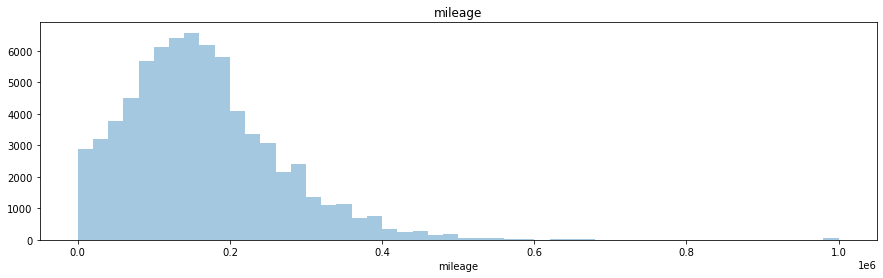

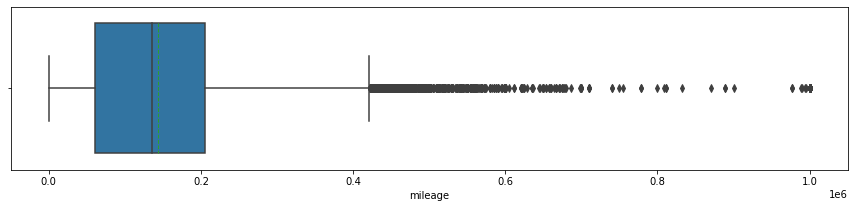

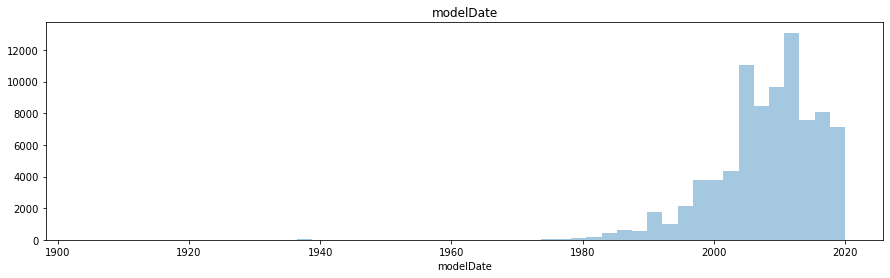

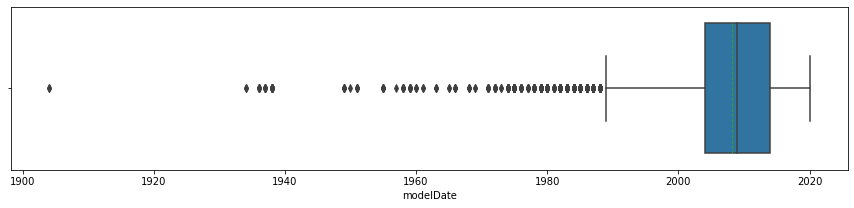

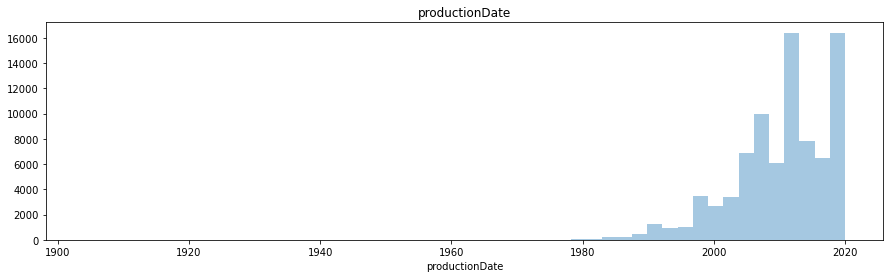

...

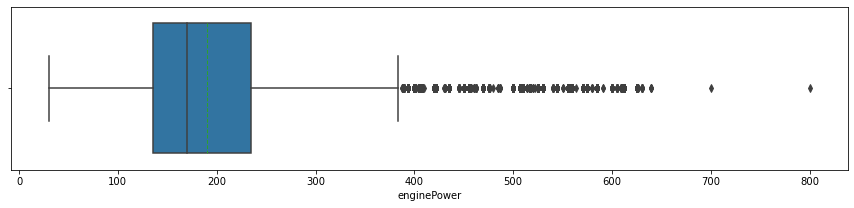

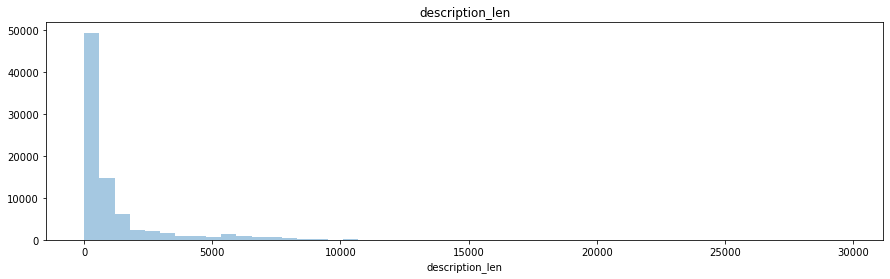

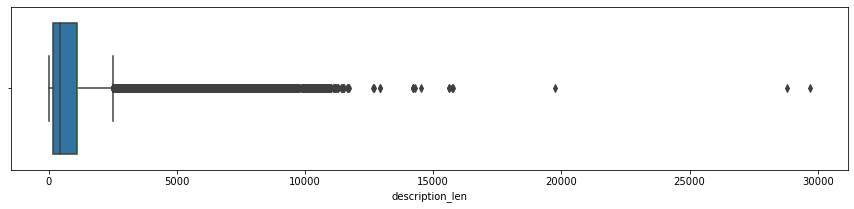

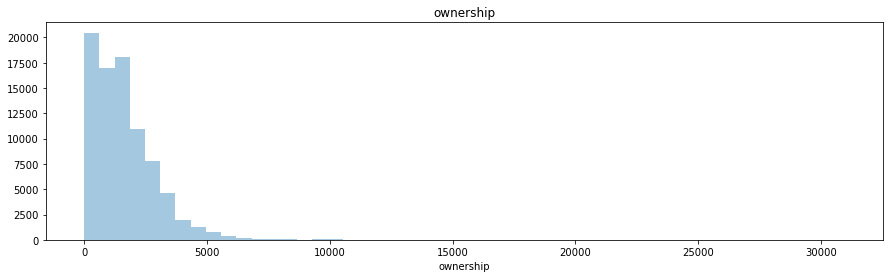

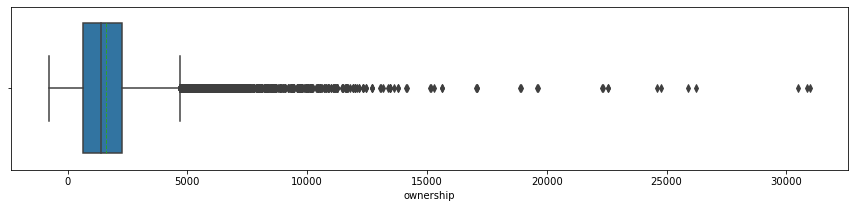

In [79]:
# Let's build graphs of the distribution of numerical variables
for i in num_cols:
    # gistogram
    plt.figure(figsize=(15, 4))
    sns.distplot(final_db[i][final_db[i] > 0].dropna(), kde=False, rug=False)
    plt.title(i)
    plt.show()

    # boxplot
    plt.figure(figsize=(15, 3))
    sns.boxplot(x=final_db[i], showmeans=True, meanline=True, orient='h')

The distribution is close to normal in only for - miles, modelDate, engineDisplacement and enginePower. 
For the rest of the features, a logarithm is required.

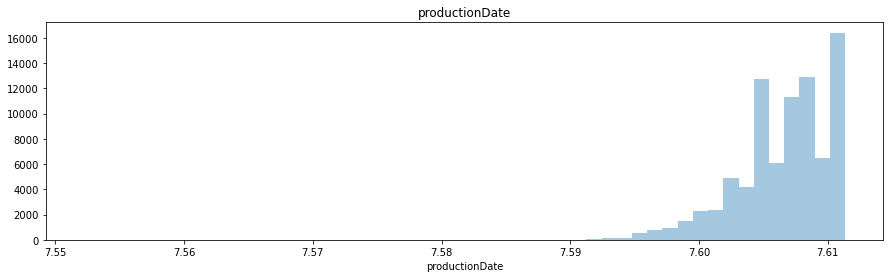

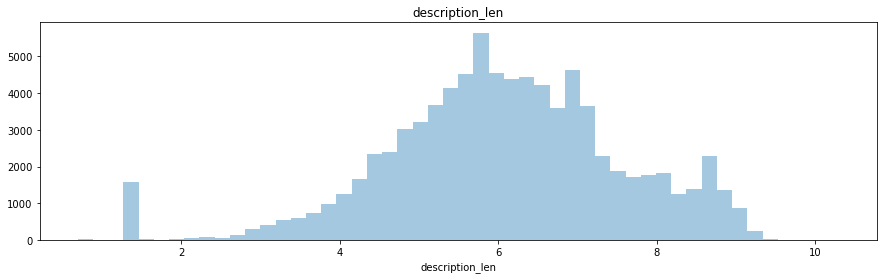

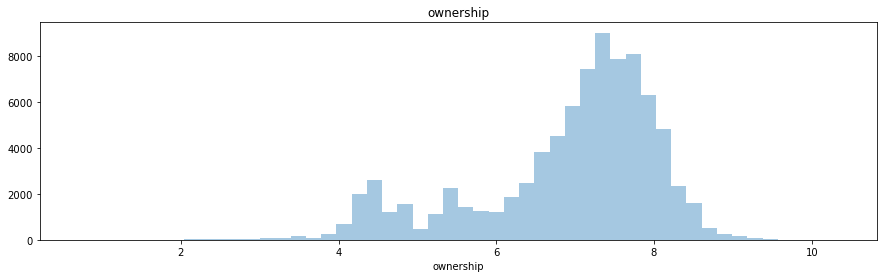

In [80]:
logarithm_cols = ['productionDate', 'description_len', 'ownership']

for i in logarithm_cols:
    # logarithm
    final_db[i] = final_db[i].apply(lambda w: np.log(w+1))

for i in logarithm_cols:
    # gistogram
    plt.figure(figsize=(15, 4))
    sns.distplot(final_db[i][final_db[i] > 0].dropna(), kde=False, rug=False)
    plt.title(i)
    plt.show()

It's certainly not perfect, but it's better than it was. For now, let's leave it as it is.
Consider outliers

### Check outliers

In [81]:
# calculate outliers for numerical features
for col in num_cols:
    # выводим название признака
    print('Numerical features "{a}":'.format(a=col))
    Q1 = final_db[col].quantile(0.25)
    Q3 = final_db[col].quantile(0.75)
    IQR = Q3 - Q1
    left = Q1 - 1.5*IQR
    right = Q3 + 1.5*IQR
    print('A number of outliers: ', final_db[col][(
        final_db[col] < left) | (final_db[col] > right)].count())
    print('\n')

Numerical features "mileage":
A number of outliers:  1232


Numerical features "modelDate":
A number of outliers:  1886


Numerical features "productionDate":
A number of outliers:  2731


Numerical features "engineDisplacement":
A number of outliers:  2361


Numerical features "enginePower":
A number of outliers:  3430


Numerical features "description_len":
A number of outliers:  1818


Numerical features "ownership":
A number of outliers:  6348




In [82]:
# A function that assigns values in the interquartile range to outliers
def cut_IQR(column, data):
    Q25 = data[column].quantile(0.25)
    Q75 = data[column].quantile(0.75)
    IQR = Q75 - Q25
    l_bound = Q25 - 1.5*IQR
    r_bound = Q75 + 1.5*IQR

    data[column] = data[column].apply(lambda x: r_bound if x >= r_bound else x)
    data[column] = data[column].apply(lambda x: l_bound if x <= l_bound else x)


for col in num_cols:
    cut_IQR(col, final_db)

In [83]:
final_db.isna().sum()

bodyType               0
brand                  0
color                  0
fuelType               0
modelDate              0
numberOfDoors          0
productionDate         0
gear_box               0
engineDisplacement     0
electro_engine_yes     0
enginePower            0
description_len        0
mileage                0
transmission           0
handle                 0
owners                 0
vehicle_licence        0
ownership             35
model_name             0
price                  0
sell_id                0
train                  0
dtype: int64

In [84]:
# After logarythn we get the gaps on ownership column. Drop it
final_db.dropna(subset=['ownership'], inplace=True)
print(final_db.ownership.isna().sum())

0


Let's see boxplot's and correlations via heater map

<AxesSubplot:>

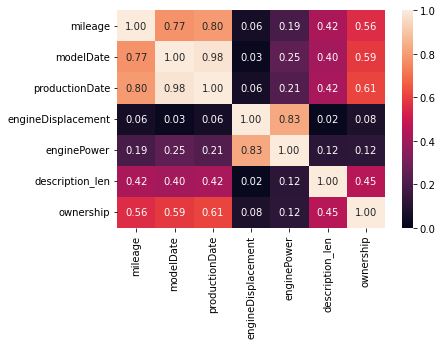

In [85]:
db_num = pd.DataFrame(data=final_db, columns=num_cols)
sns.heatmap(db_num.corr().abs(), vmin=0, vmax=1, annot=True, fmt=".2f")

We got a high correlation between modelDate and productionDate. The first shows the production date of the car, and the second shows the start date of the production of the model line.

Also got a hight correlation between engineDisplacement and enginePower; mileage and modelDate; mileage and productionDate. 

Let's look at the significance of the feature.

<AxesSubplot:>

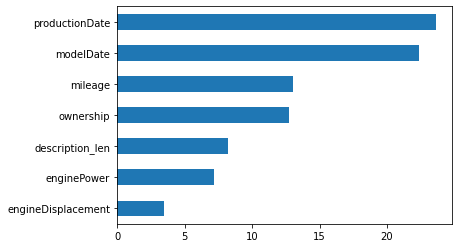

In [86]:
# build a curves of the significance of numerical features
train_db = final_db[final_db['train']==1]
imp_num = pd.Series(f_classif(train_db[num_cols], train_db['price'])[0], index=num_cols)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

The production Date is a more significant for our model. Remove the modelDate.

Engine power is a sign that more reflects quality. So with the same volume, depending on the manufacturer, the power may be different. Remove the engineDisplacement.


Despite the relatively high correlation between mileage and modelDate, let's leave these features unchanged. With standard car use, a relationship can be identified, but mileage reflects car use (for example, in a taxi), which directly affects the target variable

In [87]:
num_cols = [
    'mileage',
    'productionDate',
    'enginePower',
    'description_len',
    'ownership'
]

## Categorical column

Feature "bodyType":
внедорожник    20139
седан          17962
лифтбек         2869
хэтчбек         2820
вэн             1927
универсал       1431
купе            1155
пикап            382
открытый         240
фургон           134
лимузин            6
Name: bodyType, dtype: int64


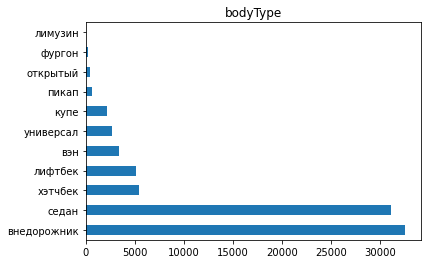

Feature "color":
чёрный        18144
серый         11114
белый          8982
синий          4961
красный        1783
зелёный        1321
золотистый     1173
голубой         590
фиолетовый      562
жёлтый          223
оранжевый       199
розовый          13
Name: color, dtype: int64


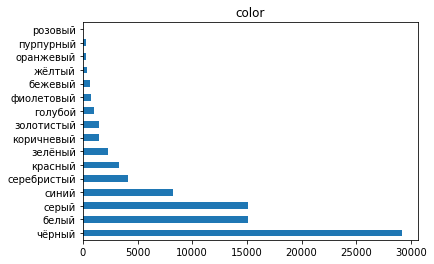

Feature "fuelType":
бензин     39231
дизель      9462
гибрид       266
электро       96
газ           10
Name: fuelType, dtype: int64


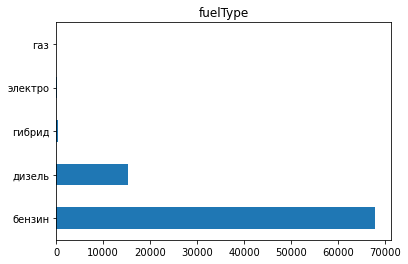

Feature "numberOfDoors":
5.0    27610
4.0    19282
2.0     1433
3.0      739
0.0        1
Name: numberOfDoors, dtype: int64


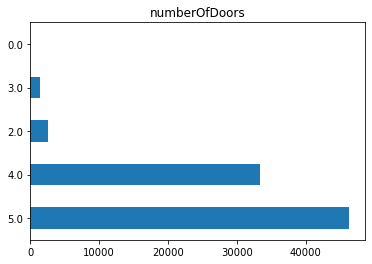

Feature "gear_box":
AUTOMATIC     28276
MECHANICAL     8796
VARIATOR       6244
ROBOT          5749
Name: gear_box, dtype: int64


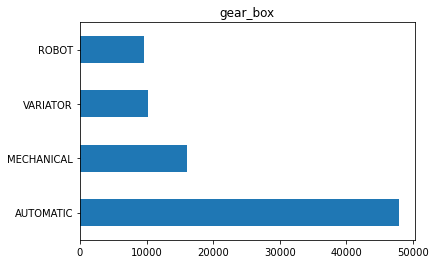

Feature "owners":
3    24421
2    13188
1    11456
Name: owners, dtype: int64


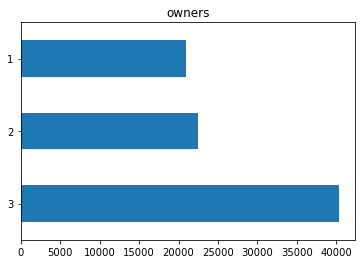

Feature "model_name":
5ER                     1668
OCTAVIA                 1492
E_KLASSE                1423
3ER                     1414
PASSAT                  1392
OUTLANDER               1367
POLO                    1290
X_TRAIL                 1151
TIGUAN                  1033
other                    959
X5                       942
QASHQAI                  940
A6                       935
RAV_4                    918
S_KLASSE                 910
CAMRY                    864
LANCER                   859
C_KLASSE                 735
X3                       707
TOUAREG                  689
GLE_KLASSE               623
JETTA                    619
LAND_CRUISER             618
A4                       603
ALMERA                   533
Q5                       526
M_KLASSE                 518
XC60                     515
GOLF                     503
XC90                     486
LAND_CRUISER_PRADO       476
RAPID                    473
7ER                      470
X6                   

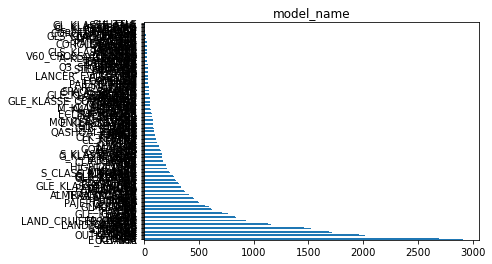

Feature "brand":
MERCEDES      7970
BMW           7361
VOLKSWAGEN    7105
NISSAN        5750
TOYOTA        4786
AUDI          4068
MITSUBISHI    3919
SKODA         2795
VOLVO         2062
HONDA         1169
LEXUS         1045
INFINITI      1035
Name: brand, dtype: int64


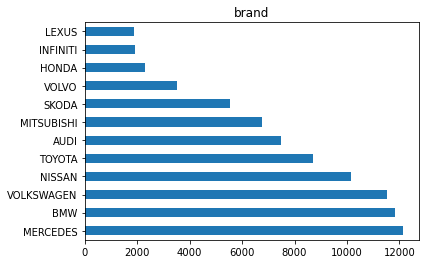

Feature "transmission":
полный      23553
передний    19597
задний       5915
Name: transmission, dtype: int64


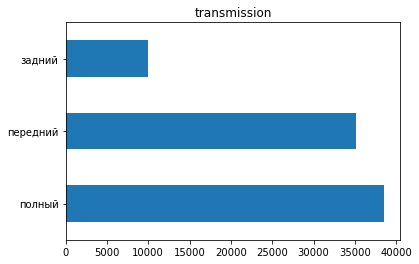

In [88]:
# consider the distribution of categorical features
for col in cat_cols:
    print('Feature "{a}":'.format(a=col))  # name

    # output unique values and their number
    print(final_db[col][final_db['train'] == 1].value_counts())

    # output distribution by features
    final_db[col].value_counts().plot.barh()
    plt.title(col)
    plt.show()

The most common features - body type: SUV, color: black, fuel: gasoline, number of doors: 5, gear_box: automatic, number of owners: 3, brand: mercedes, transmission: 4WD.

In [89]:
# convert all categorical features to numeric codes
for column in cat_cols:
    final_db[column] = final_db[column].astype('category').cat.codes

In [106]:
final_db[cat_cols].sample(3)

,bodyType,color,fuelType,gear_box,owners,model_name,brand,transmission
57691,0,12,3,0,1,262,1,2
43505,7,1,0,0,2,84,5,2
49734,4,6,0,2,2,226,8,1


In [90]:
# Correlation of categorical features
corr = round(final_db[cat_cols].corr(method='spearman'), 1)
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

,bodyType,color,fuelType,numberOfDoors,gear_box,owners,model_name,brand,transmission
bodyType,1.000,-0.000,-0.200,-0.600,0.000,0.200,-0.400,0.000,-0.600
color,-0.000,1.000,0.100,-0.000,-0.100,0.000,-0.000,-0.100,0.100
fuelType,-0.200,0.100,1.000,0.100,-0.200,-0.100,0.100,-0.100,0.300
numberOfDoors,-0.600,-0.000,0.100,1.000,0.100,-0.100,0.400,0.100,0.500
gear_box,0.000,-0.100,-0.200,0.100,1.000,-0.100,0.100,0.100,-0.100
owners,0.200,0.000,-0.100,-0.100,-0.100,1.000,-0.100,-0.000,-0.100
model_name,-0.400,-0.000,0.100,0.400,0.100,-0.100,1.000,0.300,0.300
brand,0.000,-0.100,-0.100,0.100,0.100,-0.000,0.300,1.000,-0.100
transmission,-0.600,0.100,0.300,0.500,-0.100,-0.100,0.300,-0.100,1.000


A hight positive correlation between next variables: numberOfDoors and transmission; numberOfDoors and model_name.
A high negative correlation: bodyType and numberOfDoors; bodyType and transmission.

Text(0.5, 1.0, 'Significance of cat variables')

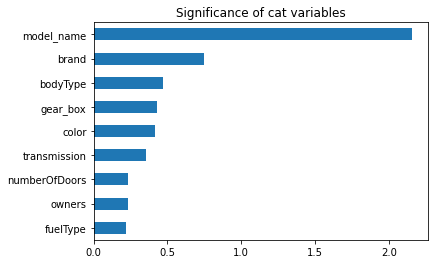

In [91]:
# Check significance of cat variables
train_db = final_db[final_db['train'] == 1]
imp_cat = pd.Series(mutual_info_classif(train_db[cat_cols],
                                        train_db['price'],
                                        discrete_features=True),
                    index=train_db[cat_cols].columns)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind='barh')
plt.title('Significance of cat variables')

The most significance variable is model_name, next brand. The least he most significance variable is fuelType.
Will use all cat features.

## Binary columns

Feature "electro_engine_yes":
0    48971
1       94
Name: electro_engine_yes, dtype: int64


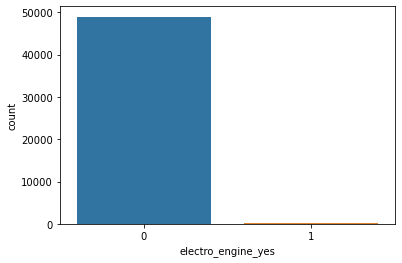

Feature "handle":
LEFT     47533
RIGHT     1532
Name: handle, dtype: int64


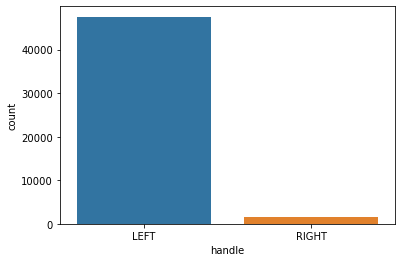

Feature "vehicle_licence":
ORIGINAL     43446
DUPLICATE     5619
Name: vehicle_licence, dtype: int64


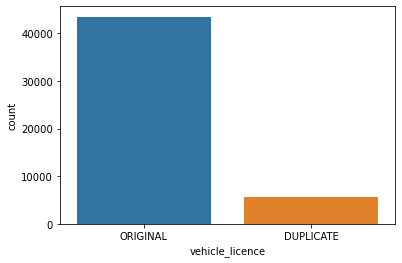

In [92]:
# consider the distribution of binary features
for col in bin_cols:
    print('Feature "{a}":'.format(a=col))  # print the name of feature

    # the number of unique values
    print(final_db[col][final_db['train'] == 1].value_counts())

    # distribution of cars via features
    plt.figure()
    sns.countplot(x=col, data=final_db[final_db['train'] == 1])
    plt.show()

the data is inhomogeneous and highly biased. As long as we leave it unchanged

In [96]:
# convert all binar features to numeric codes
for column in bin_cols:
    final_db[column] = final_db[column].astype('category').cat.codes

In [105]:
final_db[bin_cols].sample(10)

,electro_engine_yes,handle,vehicle_licence
30571,0,0,1
44049,0,0,0
52940,0,0,0
7589,0,0,1
36126,0,0,1
24365,0,0,1
50740,0,0,1
82336,0,0,1
51143,0,0,1
52851,0,0,1


## Correlation Assessment

<AxesSubplot:>

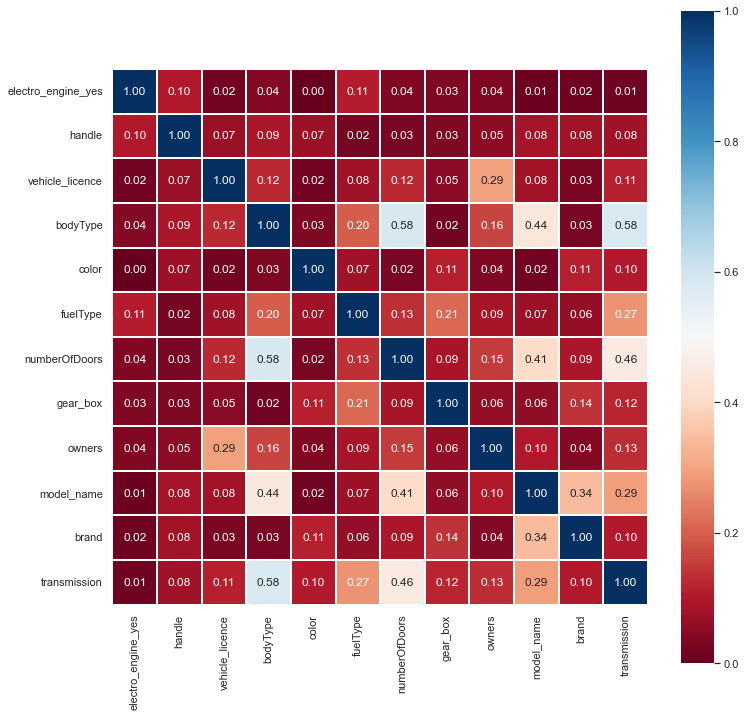

In [98]:
# Asset correlation of Spearman for non numeric valuable
sns.set(font_scale=1)
plt.subplots(figsize=(12, 12))
sns.heatmap(final_db[bin_cols + cat_cols].corr(method='spearman').abs(), vmin=0, vmax=1, square=True,
            annot=True, fmt=".2f", linewidths=0.1, cmap="RdBu")

<AxesSubplot:>

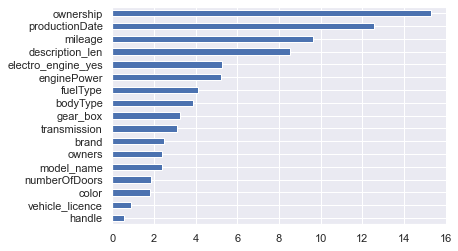

In [99]:
# Let's look at the significance of all variables
imp_num = pd.Series(f_classif(final_db[cat_cols + num_cols + bin_cols], 
                              final_db['price'])[0], index = cat_cols + num_cols + bin_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

Let's see on distribution of target feature

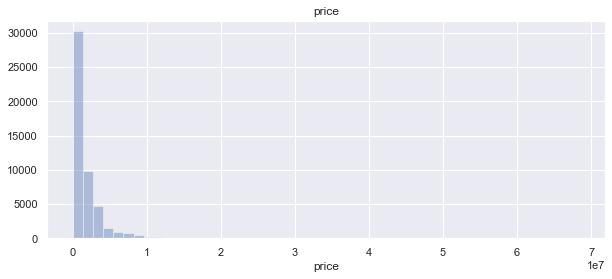

In [100]:
plt.figure(figsize=(10, 4))
sns.distplot(final_db['price'][final_db['price'] > 0], kde=False, rug=False)
plt.title('price')
plt.show()

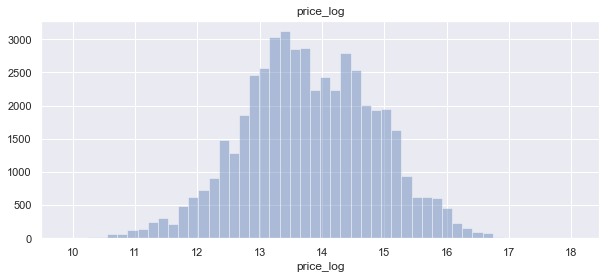

In [101]:
# Trying to logarithm it
final_db['price_log'] = final_db['price'].apply(lambda w: np.log(w+1))

plt.figure(figsize=(10, 4))
sns.distplot(final_db['price_log']
             [final_db['price_log'] > 0], kde=False, rug=False)
plt.title('price_log')
plt.show()

<AxesSubplot:>

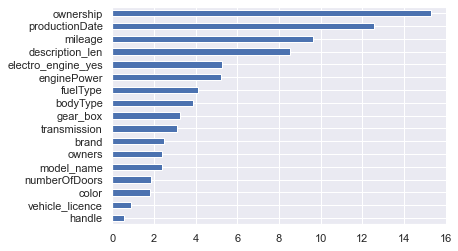

In [102]:
# Let's look at the significance of all variables
imp_num = pd.Series(f_classif(final_db[cat_cols + num_cols + bin_cols],
                              final_db['price_log'])[0], index=cat_cols + num_cols + bin_cols)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

A high correlation between numberOfDoors and bodyType. Often the number of doors is determined by the body type, variations within the same body type are not so common. And since the significance of the feature numberOfDoors is lower, we will remove it.
High correlation between bodyType and transmission is are mistake. 
Also, we get a high correlation between modelName and bodyType. This is quite applicable, since many models are represented by only one type of body. Let's leave it unchanged.
The most significant feature is ownership. the less - handle.

In [103]:
num_cols = [
    'mileage',
    'productionDate',
    'enginePower',
    'description_len',
    'ownership'
]

# binary
bin_cols = ['electro_engine_yes', 'handle', 'vehicle_licence']

# categorical
cat_cols = [
    'bodyType',
    'color',
    'fuelType',
    'gear_box',
    'owners',
    'model_name',
    'brand',
    'transmission'
]

# Machine Learning

In [109]:
# extract train
X = final_db.query('train == 1').drop(
    ['train', 'sell_id', 'price', 'price_log'], axis=1)
X_sub = final_db.query('train == 0').drop(
    ['train', 'sell_id', 'price', 'price_log'], axis=1)
y = final_db.query('train == 1').price

X.sample(3)

,bodyType,brand,color,fuelType,modelDate,numberOfDoors,productionDate,gear_box,engineDisplacement,electro_engine_yes,enginePower,description_len,mileage,transmission,handle,owners,vehicle_licence,ownership,model_name
44699,0,5,7,3,2009.0,4,7.606885,0,3.0,0,224.0,5.017280,142000.0,2,0,2,1,5.638355,106
22527,7,7,12,0,2008.0,3,7.606387,3,2.5,0,182.0,6.340359,163800.0,1,0,1,1,6.895683,230
542,7,0,15,0,2016.0,3,7.611348,2,1.4,0,150.0,7.903227,0.0,1,0,0,1,5.220356,17


In [111]:
X.shape # check the size

(49065, 19)

## Building a base model

In [112]:
# Let's split the data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [113]:
X.shape, X_train.shape, X_test.shape

((49065, 19), (39252, 19), (9813, 19))

In [114]:
# We will use Mean Percentage Absolute Error MAPE as a metric. Write the metric as a function
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [115]:
rf_stand = RandomForestRegressor(random_state=42)
rf_stand.fit(X_train, y_train)

# Writing down predictions
y_pred_RFR = rf_stand.predict(X_test)

# MAPE:
print(
    f"RandomForestRegressor стандартный, Точность модели по метрике MAPE: {(mape(y_test, y_pred_RFR))*100:0.2f}%")

RandomForestRegressor стандартный, Точность модели по метрике MAPE: 14.39%


Let's try to iterate through various parameters and determine the optimal hyperparameters.
But let's check the standard parameters at first

In [116]:
pprint(rf_stand.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [117]:
# Add regularization types
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=20)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
criterion = ['squared_error', 'absolute_error', 'poisson']
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

# Create RandomizedSearchCV
rf_best = RandomizedSearchCV(estimator=rf_stand, param_distributions=random_grid, n_iter=10,
                             cv=3, verbose=2, random_state=42, n_jobs=-1)

rf_best.fit(X_train, y_train)
model_rf_best = rf_best.best_estimator_

# View best hyperparameters
rf_best_parameters = model_rf_best.get_params()
for param_name in rf_best_parameters:
    print(param_name, rf_best_parameters[param_name], '\n')

Fitting 3 folds for each of 10 candidates, totalling 30 fits
bootstrap False 

ccp_alpha 0.0 

criterion mse 

max_depth 40 

max_features sqrt 

max_leaf_nodes None 

max_samples None 

min_impurity_decrease 0.0 

min_impurity_split None 

min_samples_leaf 4 

min_samples_split 5 

min_weight_fraction_leaf 0.0 

n_estimators 1526 

n_jobs None 

oob_score False 

random_state 42 

verbose 0 

warm_start False 



In [123]:
rf_hyperparam = RandomForestRegressor(random_state=42,
                                      n_jobs=-1,
                                      bootstrap=False,
                                      ccp_alpha=0.0,
                                      criterion='mse',
                                      max_depth=40,
                                      max_features='sqrt',
                                      max_leaf_nodes=None,
                                      max_samples=None,
                                      min_impurity_decrease=0.0,
                                      min_samples_leaf=4,
                                      min_samples_split=5,
                                      min_weight_fraction_leaf=0.0,
                                      n_estimators=1526,
                                      oob_score=False,
                                      verbose=0,
                                      warm_start=False)
rf_hyperparam.fit(X_train, y_train)

# Writing down predictions
y_pred_RFR_hyper = rf_hyperparam.predict(X_test)

# MAPE:
print(
    f"RandomForestRegressor с гипер парамметрами, Точность модели по метрике MAPE: {(mape(y_test, y_pred_RFR_hyper))*100:0.2f}%")

RandomForestRegressor с гипер парамметрами, Точность модели по метрике MAPE: 14.75%


## Testing other models
### RandonForest2000

In [118]:
rf_stand2000 = RandomForestRegressor(
    2000, random_state=42, n_jobs=-1, verbose=1)
rf_stand2000.fit(X_train, y_train)

# Writing down predictions
y_pred_RFR_2000 = rf_stand2000.predict(X_test)

# MAPE:
print(
    f"RandomForestRegressor2000, Точность модели по метрике MAPE: {(mape(y_test, y_pred_RFR_2000))*100:0.2f}%")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done 2000 out of 2000 | elapsed:  1.0min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 1234 tasks      | elapsed:    0.6s


RandomForestRegressor2000, Точность модели по метрике MAPE: 14.28%


[Parallel(n_jobs=8)]: Done 1784 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 2000 out of 2000 | elapsed:    1.0s finished


### RandonForest3000

In [119]:
rf_stand3000 = RandomForestRegressor(
    3000, random_state=42, n_jobs=-1, verbose=1)
rf_stand3000.fit(X_train, y_train)

# Writing down predictions
y_pred_RFR_3000 = rf_stand3000.predict(X_test)

# MAPE:
print(
    f"RandomForestRegressor3000, Точность модели по метрике MAPE: {(mape(y_test, y_pred_RFR_3000))*100:0.2f}%")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   42.3s
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3000 out of 3000 | elapsed:  1.7min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 1234 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: D

RandomForestRegressor3000, Точность модели по метрике MAPE: 14.28%


[Parallel(n_jobs=8)]: Done 3000 out of 3000 | elapsed:    1.6s finished


### Stacking

In [120]:
estimators = [('rfr', RandomForestRegressor(random_state=42, n_jobs=-1,)),
              ('etr', ExtraTreesRegressor(random_state=42))]

stacking = StackingRegressor(estimators=estimators,
                             final_estimator=LinearRegression())


stacking.fit(X_train, y_train)
predict_stacking = stacking.predict(X_test)
print(
    f"Stacking, Точность модели по метрике MAPE: {(mape(y_test, y_pred_RFR_2000))*100:0.2f}%")

Stacking, Точность модели по метрике MAPE: 14.28%


### XGBoost

In [121]:
xg_reg = xgb.XGBRegressor(objective='reg:squarederror',
                          colsample_bytree=0.5,
                          learning_rate=0.03,
                          max_depth=12,
                          alpha=1,
                          n_jobs=-1,
                          n_estimators=1000)
xg_reg.fit(X_train, y_train)

# Writing down predictions
xg_red_pred = xg_reg.predict(X_test)

# MAPE:
print(
    f"XGBoost, Точность модели по метрике MAPE: {(mape(y_test, xg_red_pred))*100:0.2f}%")

XGBoost, Точность модели по метрике MAPE: 14.35%


After all experiments was choosen the StackingRegressor as a result estimator

# Submission

In [124]:
predict_submission = stacking.predict(X_sub)

In [125]:
sample_submission['price'] = np.round(predict_submission)
sample_submission.to_csv(f'submission.csv', index=False)
sample_submission.head()

,sell_id,price
0,1100575026,670680.0
1,1100549428,894092.0
2,1100658222,812764.0
3,1100937408,689597.0
4,1101037972,672899.0


In [126]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   sell_id  34686 non-null  int64  
 1   price    34686 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 542.1 KB
